In [1]:
import numpy as np
from tqdm import tqdm
from pathlib import Path
import plotly.graph_objects as go
import matplotlib.pyplot as plt

In [2]:
%matplotlib notebook
%matplotlib notebook

# Load Data

In [3]:
min_topics = 2
max_topics = 33

In [4]:
# load topic distributions
topic_distributions = {}
for n_topics in tqdm(range(min_topics, max_topics)):
    try:
        distribution_file_name = f'data/topic_distributions_{n_topics}.npy'
        topic_distributions[n_topics] = np.load(distribution_file_name)
    except:
        continue

100%|██████████| 31/31 [00:01<00:00, 27.20it/s]


In [5]:
valid_topic_numbers = list(topic_distributions.keys())
n_papers = topic_distributions[valid_topic_numbers[0]].shape[0]
valid_topic_numbers

[2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32]

In [6]:
inclusion_matrix = {}
papers_per_topic = {}
for i in tqdm(valid_topic_numbers):
    inclusion_matrix[i] = np.full([i, i], 0)
    papers_per_topic[i] = np.full([i], 0)
    for t1 in range(i):
        papers_per_topic[i][t1] = np.sum(topic_distributions[i][:,t1])
        for t2 in range(i):
            inclusion_matrix[i][t1, t2] = np.sum( topic_distributions[i][:,t1] * 
                                                   topic_distributions[i][:,t2] )
#     for p in range(n_papers):
#         t1 = np.argmax(topic_distributions[valid_topic_numbers[i]][p,:])
#         t2 = np.argmax(topic_distributions[valid_topic_numbers[i+1]][p,:])
#         papers_per_topic[i][t1] = np.sum(topic_distributions[valid_topic_numbers[i]][:,t1])
#         if topic_distributions[valid_topic_numbers[i]][p,t1] > 0.5 and topic_distributions[valid_topic_numbers[i+1]][p,t2] > 0.5:
#             transition_matrix[i][t1, t2] = transition_matrix[i][t1, t2]+1

100%|██████████| 31/31 [00:03<00:00,  3.28it/s]


<IPython.core.display.Javascript object>


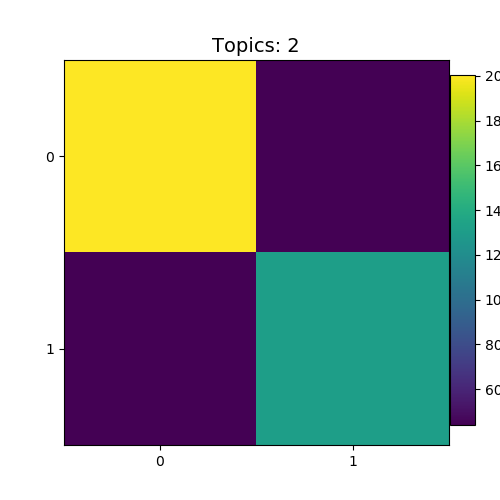

<IPython.core.display.Javascript object>


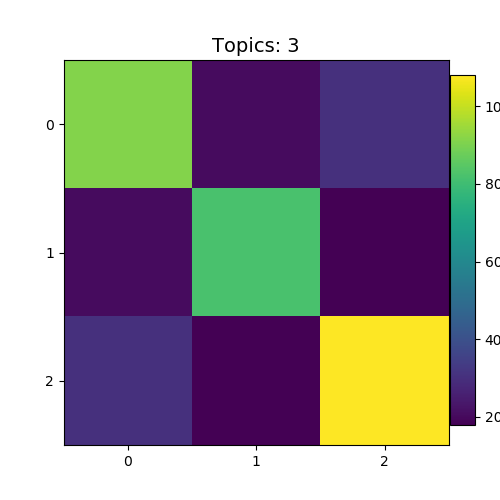

<IPython.core.display.Javascript object>


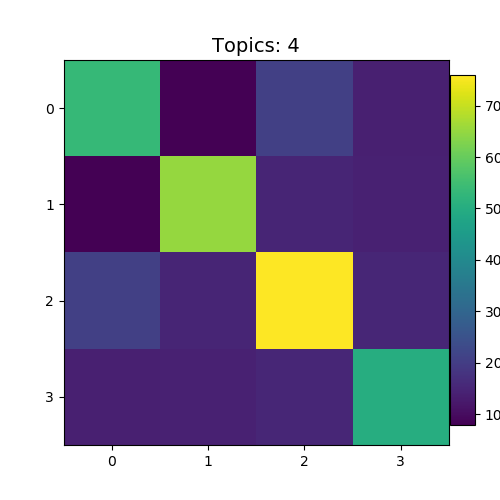

<IPython.core.display.Javascript object>


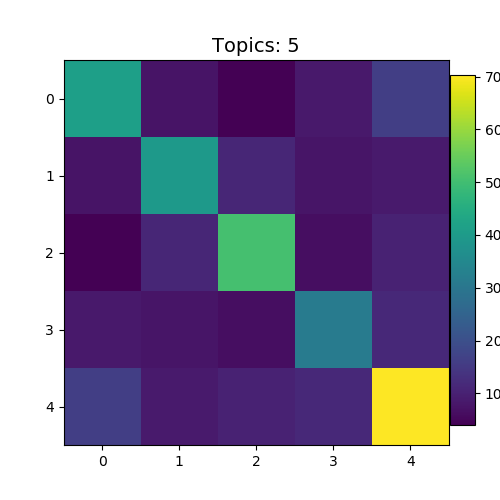

<IPython.core.display.Javascript object>


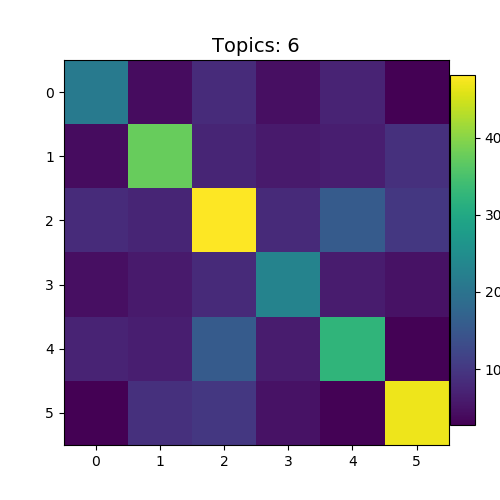

<IPython.core.display.Javascript object>


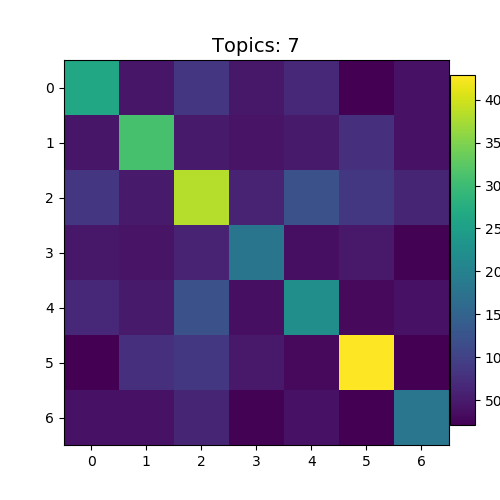

<IPython.core.display.Javascript object>


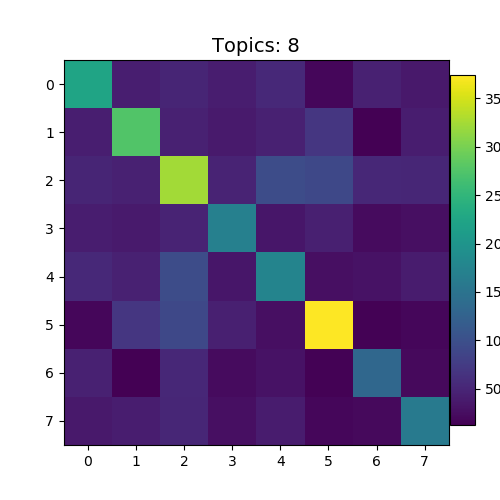

<IPython.core.display.Javascript object>


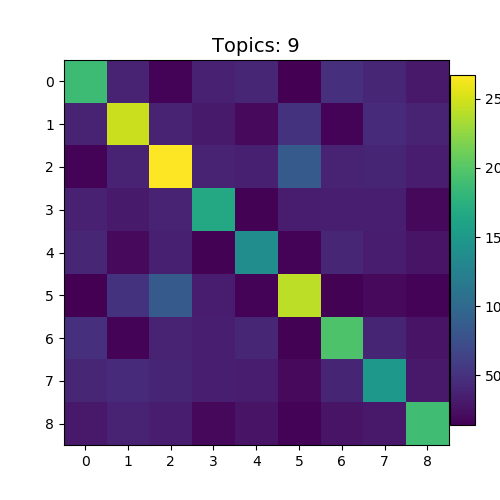

<IPython.core.display.Javascript object>


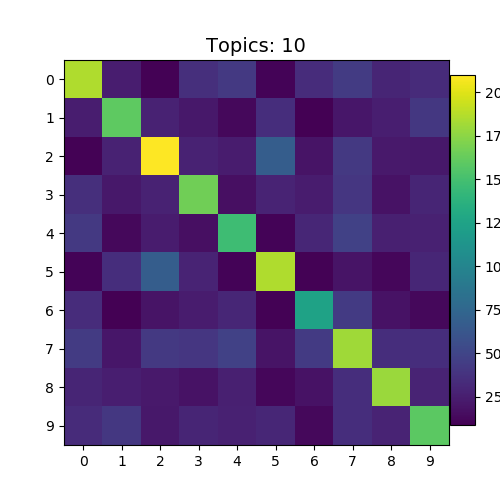

<IPython.core.display.Javascript object>


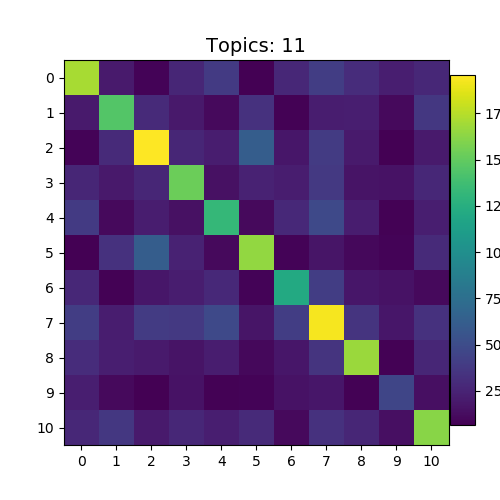

<IPython.core.display.Javascript object>


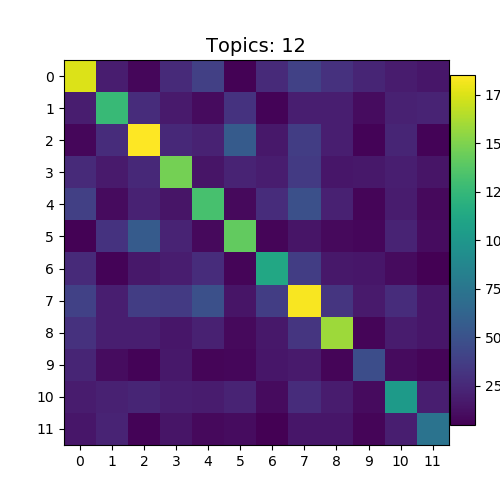

<IPython.core.display.Javascript object>


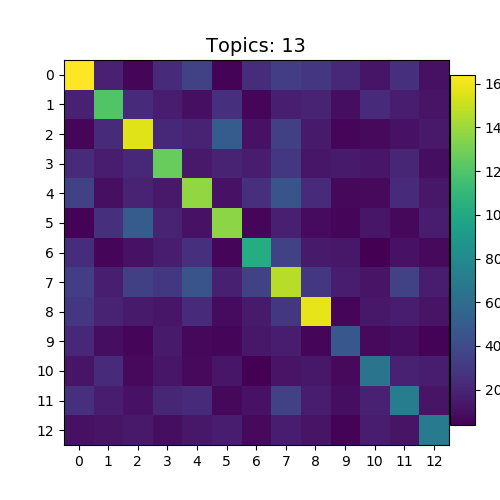

<IPython.core.display.Javascript object>


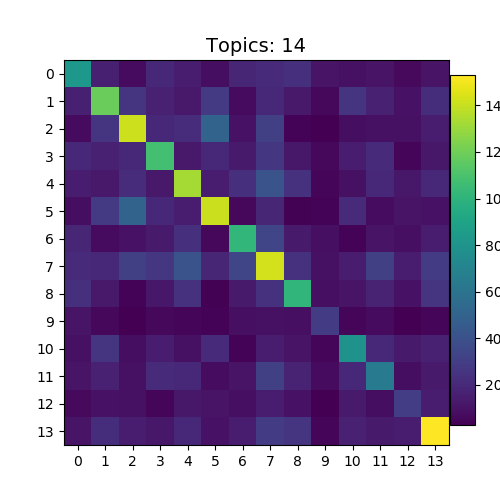

<IPython.core.display.Javascript object>


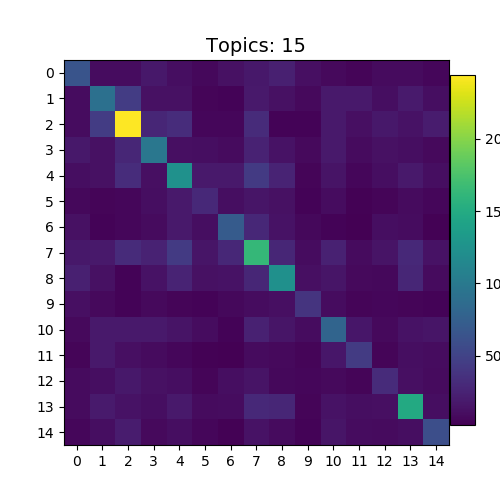

<IPython.core.display.Javascript object>


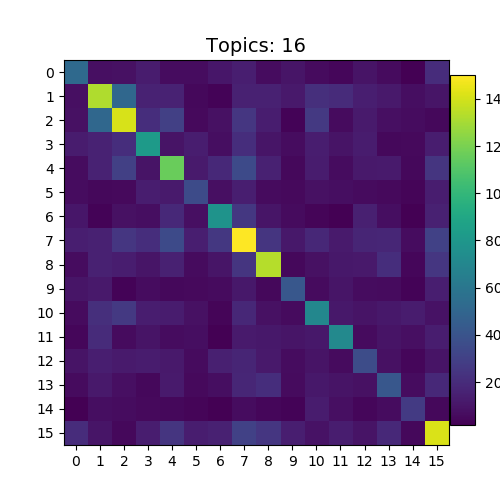

<IPython.core.display.Javascript object>


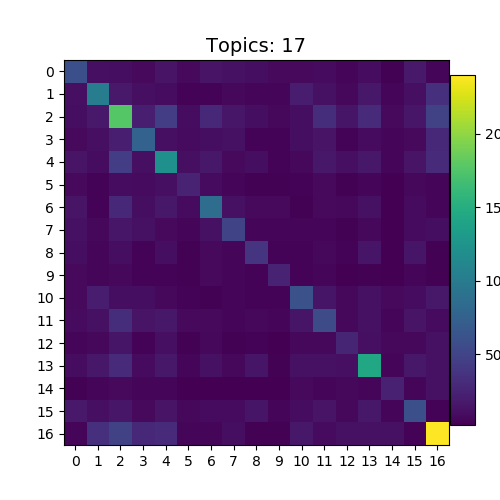

<IPython.core.display.Javascript object>


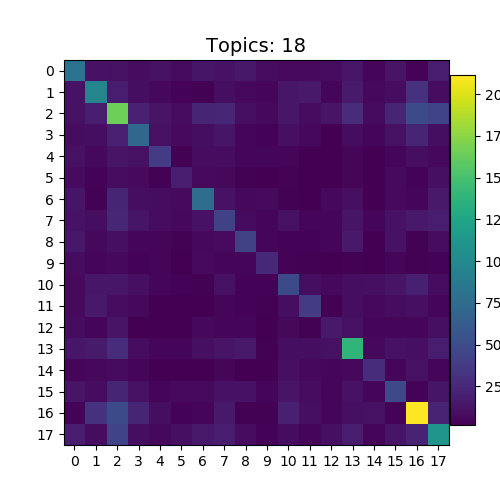

<IPython.core.display.Javascript object>


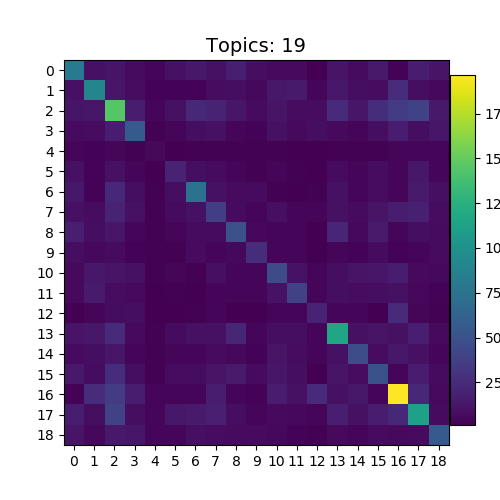

<IPython.core.display.Javascript object>


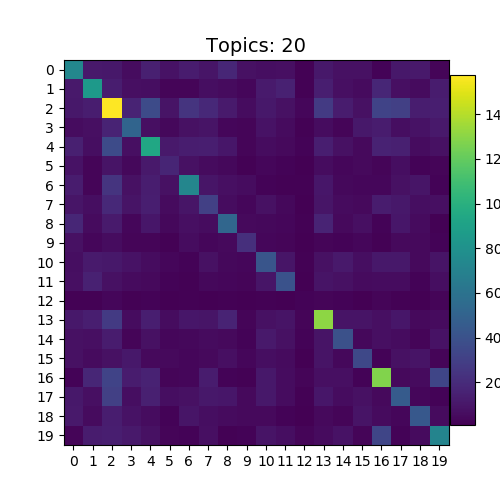

<IPython.core.display.Javascript object>


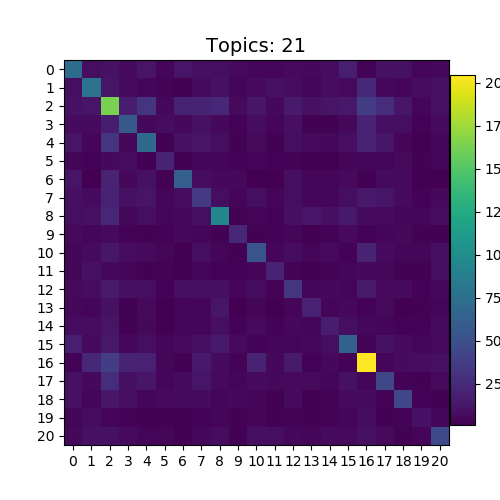

/home/mashrekur/anaconda3/lib/python3.7/site-packages/matplotlib/pyplot.py:514: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



<IPython.core.display.Javascript object>


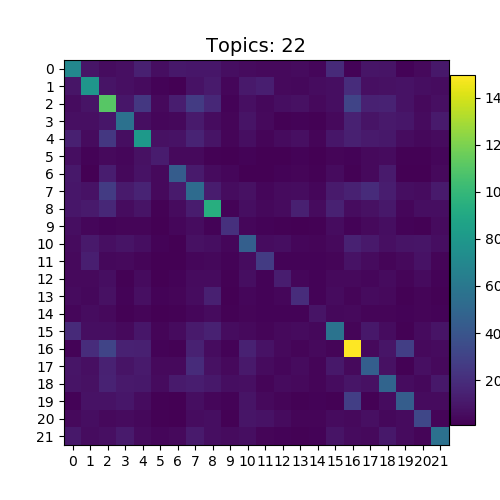

<IPython.core.display.Javascript object>


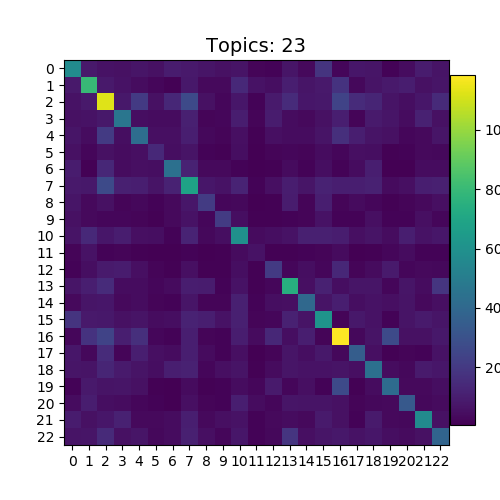

<IPython.core.display.Javascript object>


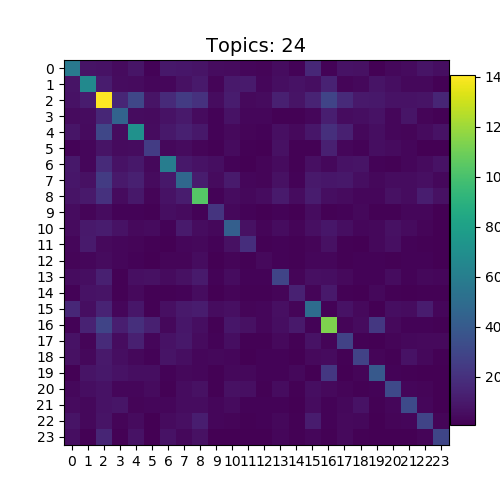

<IPython.core.display.Javascript object>


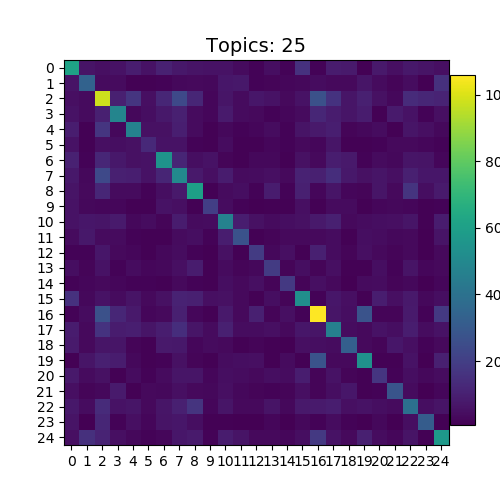

<IPython.core.display.Javascript object>


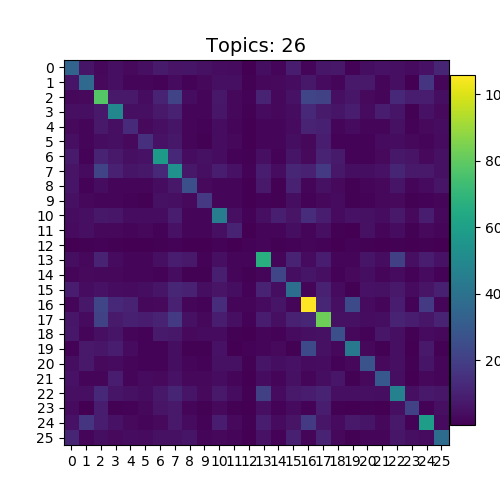

<IPython.core.display.Javascript object>


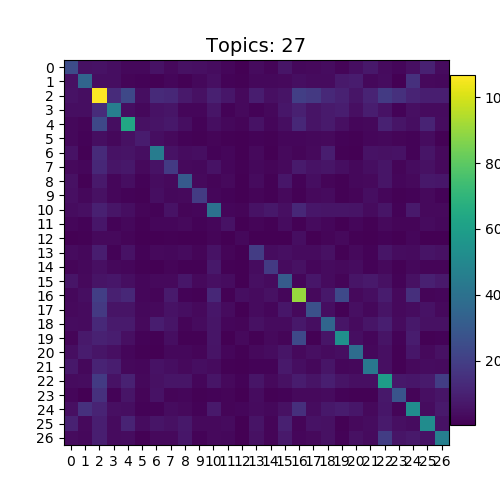

<IPython.core.display.Javascript object>


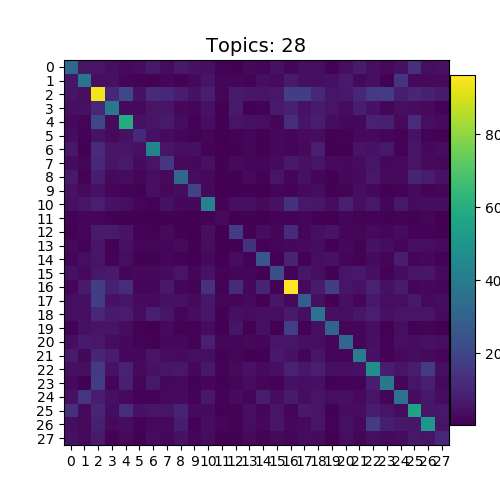

<IPython.core.display.Javascript object>


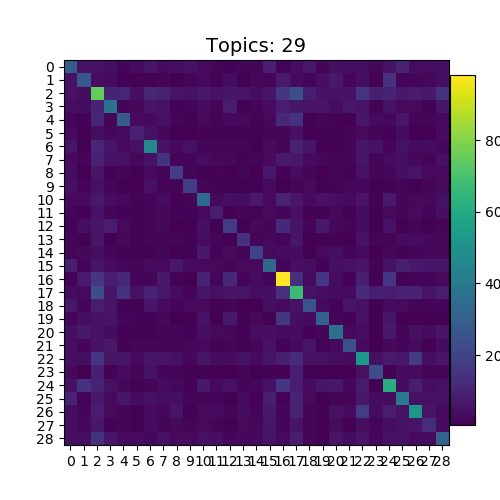

<IPython.core.display.Javascript object>


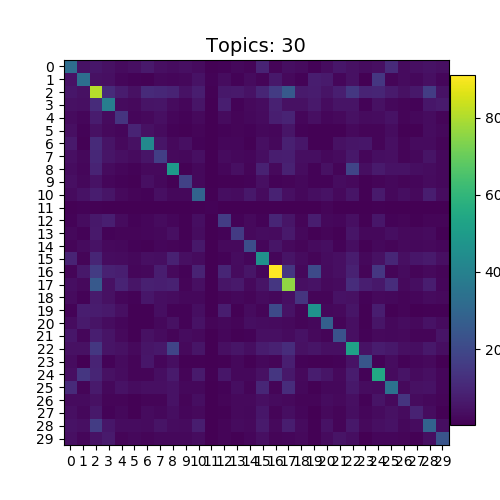

<IPython.core.display.Javascript object>


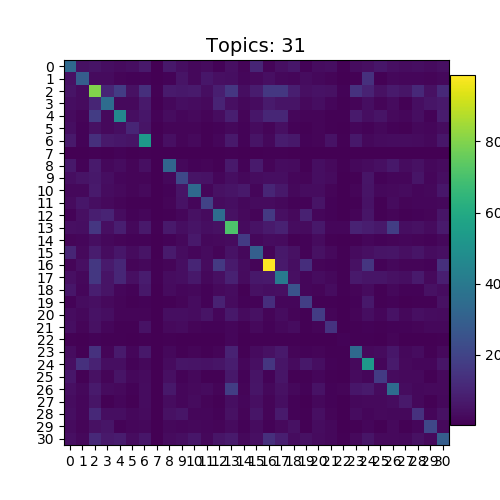

<IPython.core.display.Javascript object>


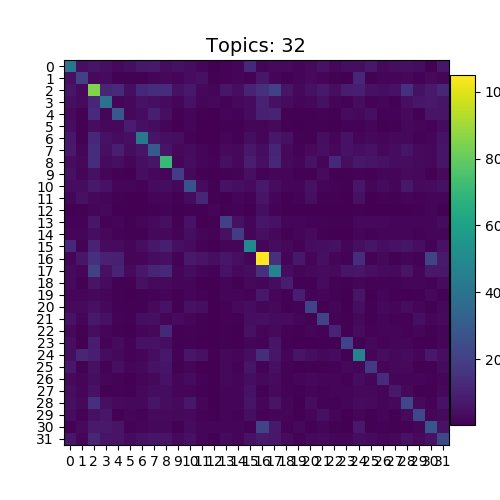

In [7]:
# plot trnasition matrixes
for i in valid_topic_numbers:
    fig, ax = plt.subplots(1,1, figsize=(5,5))
    plotdata = inclusion_matrix[i]# / papers_per_topic[i]
    res = ax.imshow(plotdata.transpose(), cmap="viridis", interpolation='nearest')
    width = i
    height = i
    ax.set_xticks(range(width))
    ax.set_yticks(range(height))
#     ax.set_ylabel('New Topics')
#     ax.set_xlabel('Old Topics')
    ax.set_title(f'Topics: {i}', fontsize=14)
    cbar_ax = fig.add_axes([0.9, 0.15, 0.05, 0.7])
    fig.colorbar(res, cax=cbar_ax)

# Anchored Create Transition Matrixes

In [9]:
anchor = 1
transition_matrix = {}
papers_per_topic = {}
papers_per_topic[anchor] = np.full([valid_topic_numbers[anchor]], 0)
for i in tqdm(range(len(valid_topic_numbers))):
    transition_matrix[i] = np.full([valid_topic_numbers[anchor], valid_topic_numbers[i]], 0)
    papers_per_topic[i] = np.full([valid_topic_numbers[i]], 0)
    for t1 in range(valid_topic_numbers[anchor]):
        papers_per_topic[anchor][t1] = np.sum(topic_distributions[valid_topic_numbers[anchor]][:,t1])
        for t2 in range(valid_topic_numbers[i]):
            transition_matrix[i][t1, t2] = np.sum( topic_distributions[valid_topic_numbers[anchor]][:,t1] * 
                                                   topic_distributions[valid_topic_numbers[i]][:,t2] )
#     for p in range(n_papers):
#         t1 = np.argmax(topic_distributions[valid_topic_numbers[i]][p,:])
#         t2 = np.argmax(topic_distributions[valid_topic_numbers[i+1]][p,:])
#         papers_per_topic[i][t1] = np.sum(topic_distributions[valid_topic_numbers[i]][:,t1])
#         if topic_distributions[valid_topic_numbers[i]][p,t1] > 0.5 and topic_distributions[valid_topic_numbers[i+1]][p,t2] > 0.5:
#             transition_matrix[i][t1, t2] = transition_matrix[i][t1, t2]+1

100%|██████████| 31/31 [00:00<00:00, 54.10it/s] 


<IPython.core.display.Javascript object>


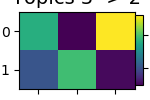

<IPython.core.display.Javascript object>


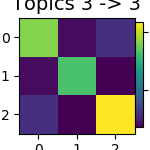

<IPython.core.display.Javascript object>


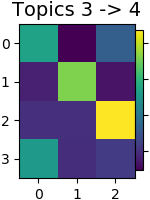

<IPython.core.display.Javascript object>


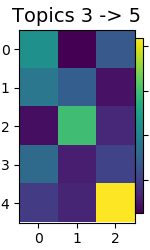

<IPython.core.display.Javascript object>


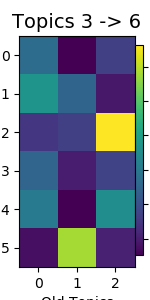

<IPython.core.display.Javascript object>


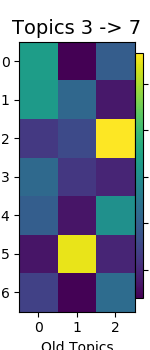

<IPython.core.display.Javascript object>


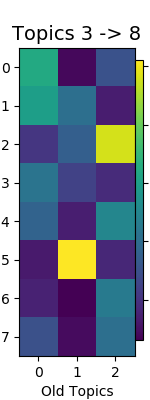

<IPython.core.display.Javascript object>


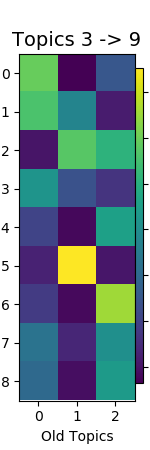

<IPython.core.display.Javascript object>


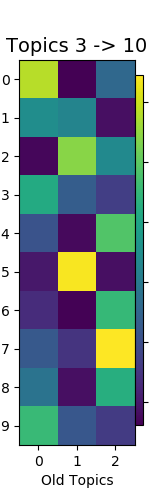

<IPython.core.display.Javascript object>


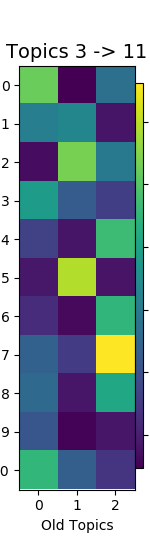

<IPython.core.display.Javascript object>


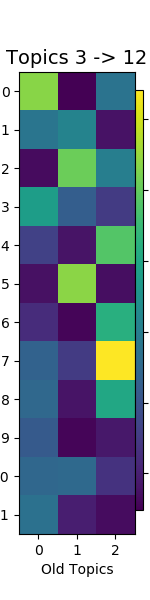

<IPython.core.display.Javascript object>


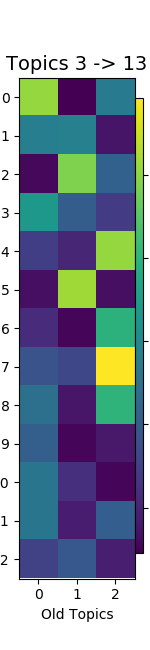

<IPython.core.display.Javascript object>


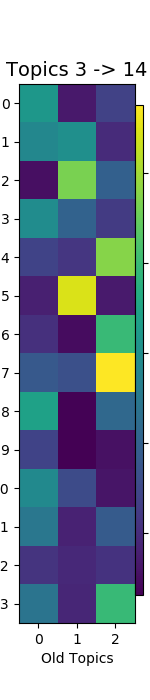

<IPython.core.display.Javascript object>


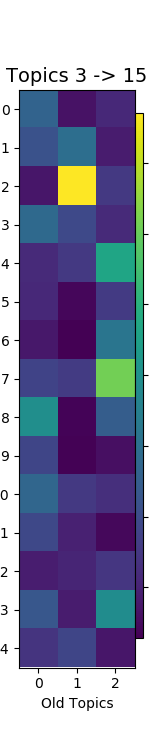

<IPython.core.display.Javascript object>


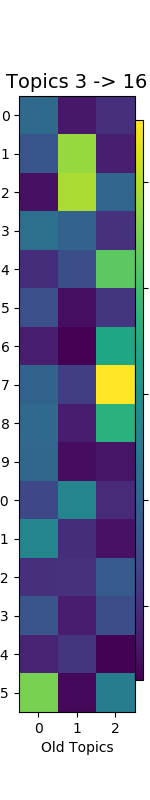

<IPython.core.display.Javascript object>


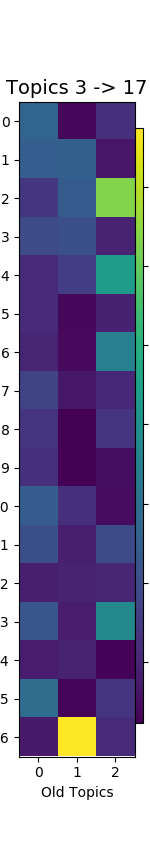

<IPython.core.display.Javascript object>


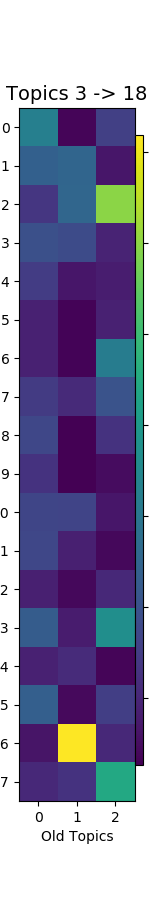

<IPython.core.display.Javascript object>


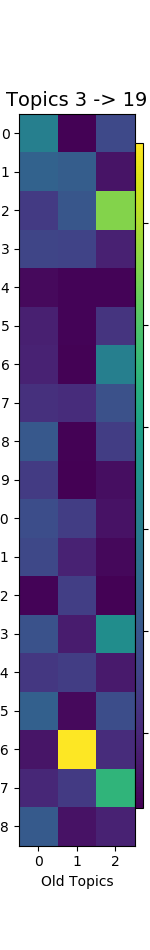

<IPython.core.display.Javascript object>


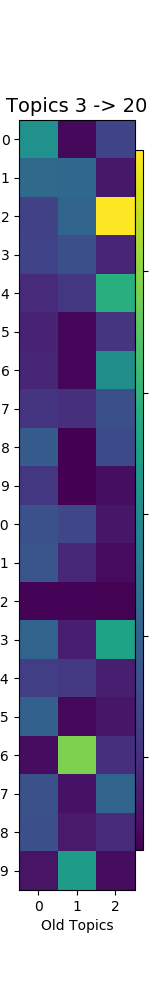

<IPython.core.display.Javascript object>


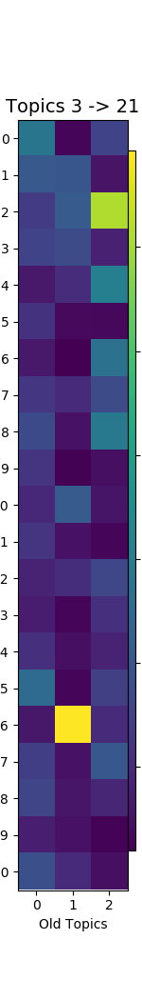

<IPython.core.display.Javascript object>


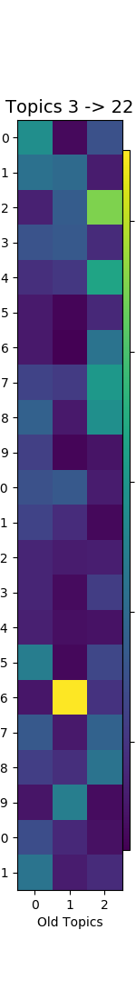

<IPython.core.display.Javascript object>


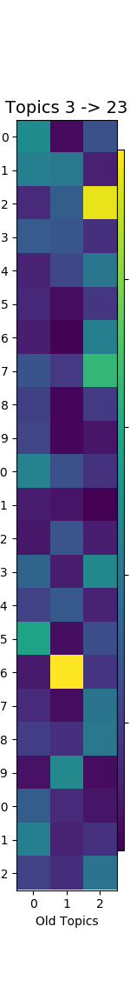

<IPython.core.display.Javascript object>


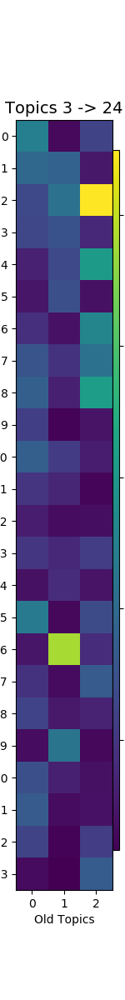

<IPython.core.display.Javascript object>


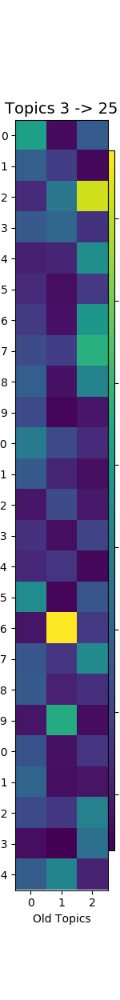

<IPython.core.display.Javascript object>


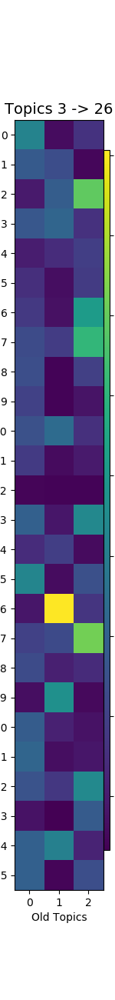

<IPython.core.display.Javascript object>


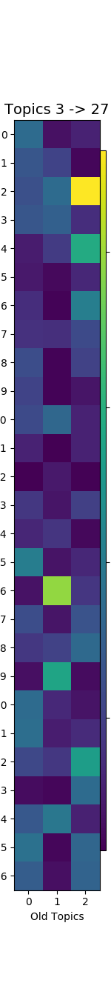

<IPython.core.display.Javascript object>


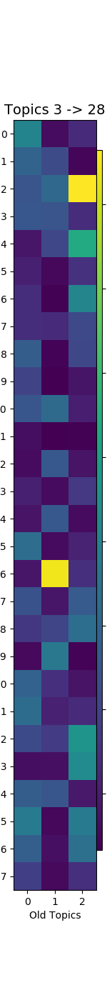

<IPython.core.display.Javascript object>


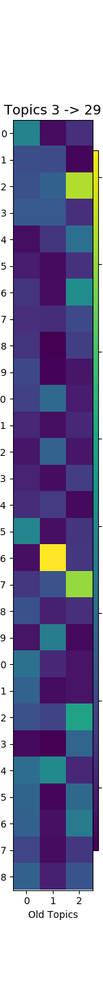

<IPython.core.display.Javascript object>


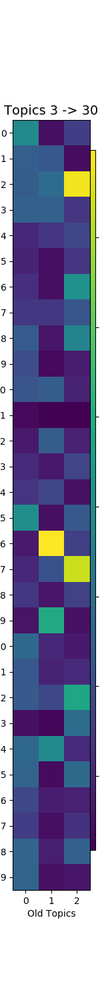

<IPython.core.display.Javascript object>


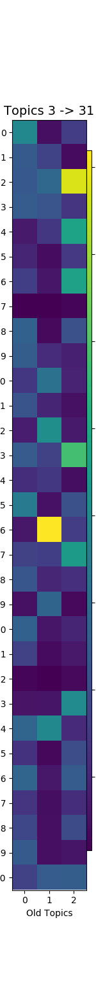

<IPython.core.display.Javascript object>


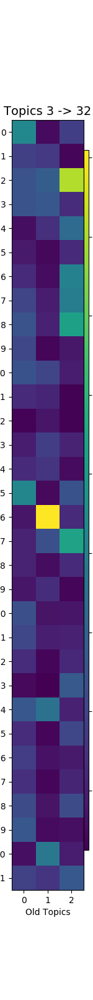

In [10]:
# plot trnasition matrixes
for i in range(len(transition_matrix.keys())):
    fig, ax = plt.subplots(1,1, figsize=(0.5*valid_topic_numbers[anchor],0.5*valid_topic_numbers[i]))
    plotdata = transition_matrix[i].transpose()# / papers_per_topic[i]
    res = ax.imshow(plotdata, cmap="viridis", interpolation='nearest')
    width = valid_topic_numbers[anchor]
    height = valid_topic_numbers[i]
    ax.set_xticks(range(width))
    ax.set_yticks(range(height))
    ax.set_ylabel('New Topics')
    ax.set_xlabel('Old Topics')
    ax.set_title(f'Topics {valid_topic_numbers[anchor]} -> {valid_topic_numbers[i]}', fontsize=14)
    cbar_ax = fig.add_axes([0.9, 0.15, 0.05, 0.7])
    fig.colorbar(res, cax=cbar_ax)

# Create Transition Matrixes

In [8]:
transition_matrix = {}
papers_per_topic = {}
for i in tqdm(range(len(valid_topic_numbers)-1)):
    transition_matrix[i] = np.full([valid_topic_numbers[i], valid_topic_numbers[i+1]], 0)
    papers_per_topic[i] = np.full([valid_topic_numbers[i]], 0)
    for t1 in range(valid_topic_numbers[i]):
        papers_per_topic[i][t1] = np.sum(topic_distributions[valid_topic_numbers[i]][:,t1])
        for t2 in range(valid_topic_numbers[i+1]):
            transition_matrix[i][t1, t2] = np.sum( topic_distributions[valid_topic_numbers[i]][:,t1] * 
                                                   topic_distributions[valid_topic_numbers[i+1]][:,t2] )
#     for p in range(n_papers):
#         t1 = np.argmax(topic_distributions[valid_topic_numbers[i]][p,:])
#         t2 = np.argmax(topic_distributions[valid_topic_numbers[i+1]][p,:])
#         papers_per_topic[i][t1] = np.sum(topic_distributions[valid_topic_numbers[i]][:,t1])
#         if topic_distributions[valid_topic_numbers[i]][p,t1] > 0.5 and topic_distributions[valid_topic_numbers[i+1]][p,t2] > 0.5:
#             transition_matrix[i][t1, t2] = transition_matrix[i][t1, t2]+1

100%|██████████| 30/30 [00:04<00:00,  2.50it/s]


In [11]:
# plot trnasition matrixes
for i in range(len(transition_matrix.keys())):
    fig, ax = plt.subplots(1,1, figsize=(0.5*valid_topic_numbers[i],0.5*valid_topic_numbers[i+1]))
    plotdata = transition_matrix[i].transpose()# / papers_per_topic[i]
    res = ax.imshow(plotdata, cmap="viridis", interpolation='nearest')
    width = valid_topic_numbers[i]
    height = valid_topic_numbers[i+1]
    ax.set_xticks(range(width))
    ax.set_yticks(range(height))
    ax.set_ylabel('New Topics')
    ax.set_xlabel('Old Topics')
    ax.set_title(f'Topics {valid_topic_numbers[i]} -> {valid_topic_numbers[i+1]}', fontsize=14)
    cbar_ax = fig.add_axes([0.9, 0.15, 0.05, 0.7])
    fig.colorbar(res, cax=cbar_ax)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

IndexError: list index out of range

# Identify Emergent Topics

In [12]:
max_flows_to = {}
for i in range(len(transition_matrix.keys())):
    total_papers_per_target = np.sum(transition_matrix[i], axis=0)
    max_flows_to[i] = np.max(transition_matrix[i], axis=0) / total_papers_per_target

In [13]:
max_flows_from = {}
for i in range(len(transition_matrix.keys())):
    total_papers_per_target = np.sum(transition_matrix[i], axis=1)
    max_flows_from[i] = np.max(transition_matrix[i], axis=1) / total_papers_per_target
#     print(valid_topic_numbers[i], valid_topic_numbers[i+1], max_flows_from)
#     print(valid_topic_numbers[i], valid_topic_numbers[i+1], total_papers_per_target)
#     print(valid_topic_numbers[i], valid_topic_numbers[i+1], max_flows_from/total_papers_per_target)
#     asdf

<IPython.core.display.Javascript object>


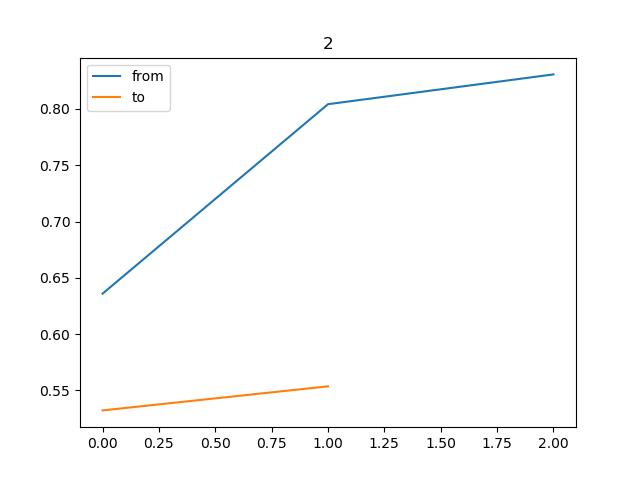

<IPython.core.display.Javascript object>


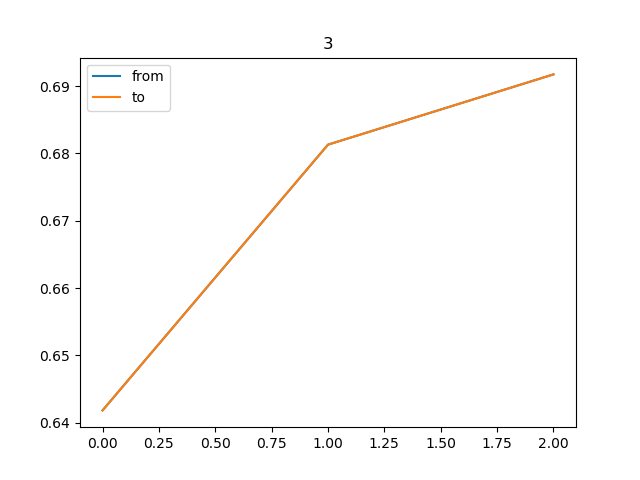

<IPython.core.display.Javascript object>


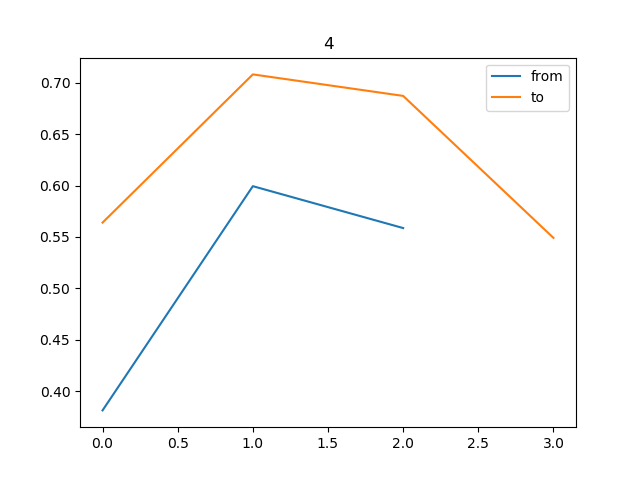

<IPython.core.display.Javascript object>


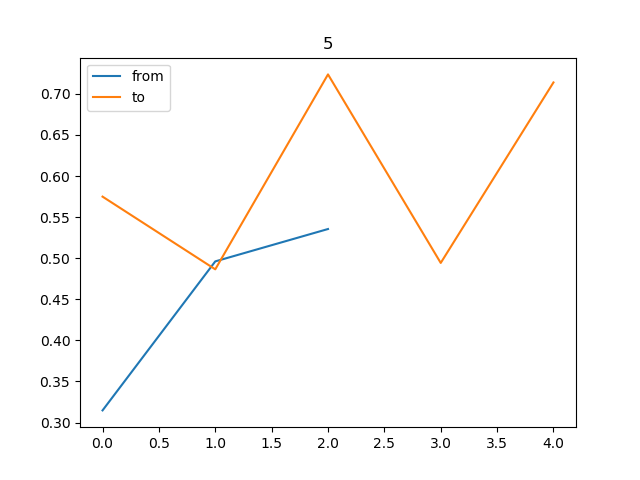

<IPython.core.display.Javascript object>


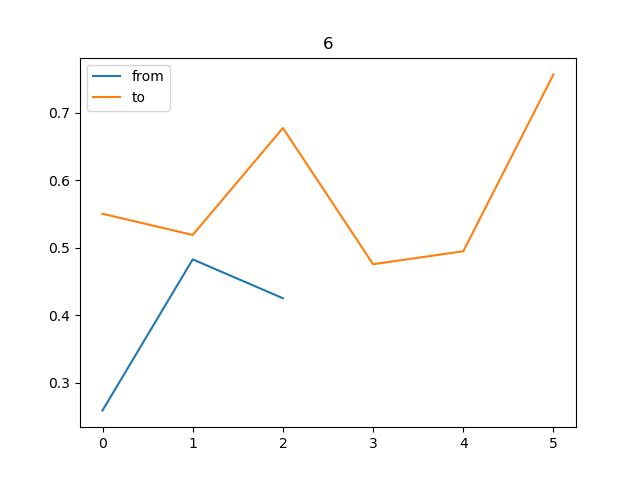

<IPython.core.display.Javascript object>


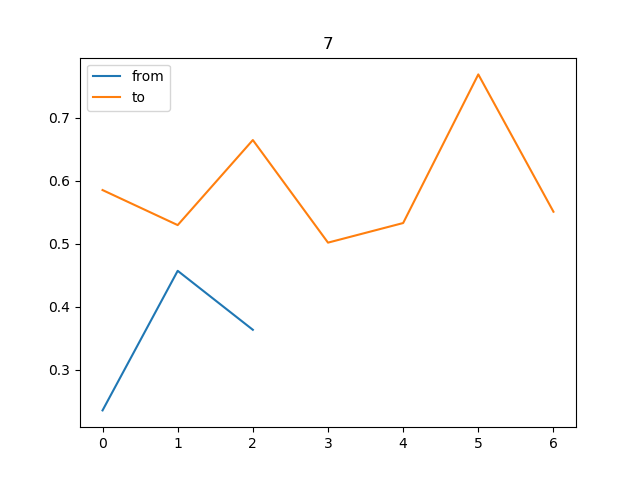

<IPython.core.display.Javascript object>


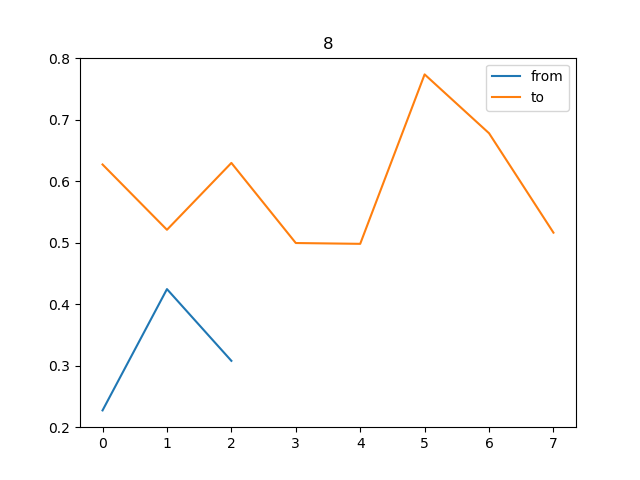

<IPython.core.display.Javascript object>


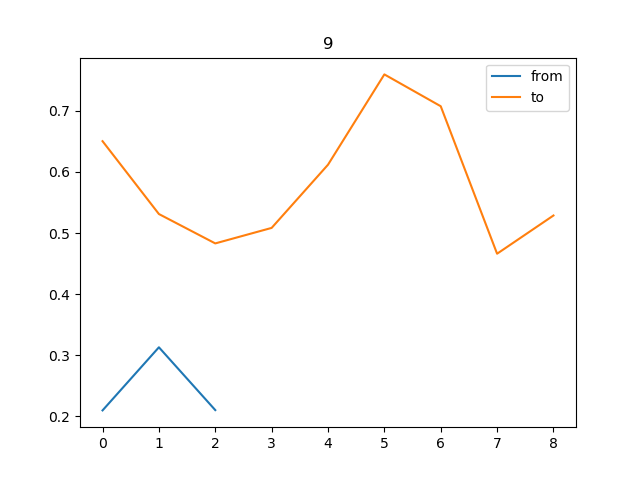

<IPython.core.display.Javascript object>


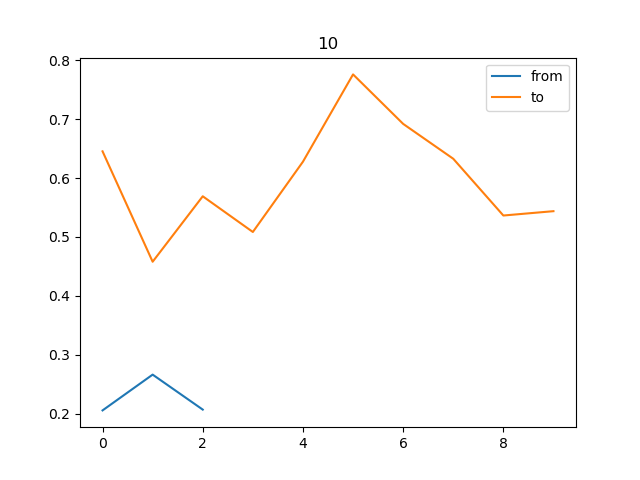

<IPython.core.display.Javascript object>


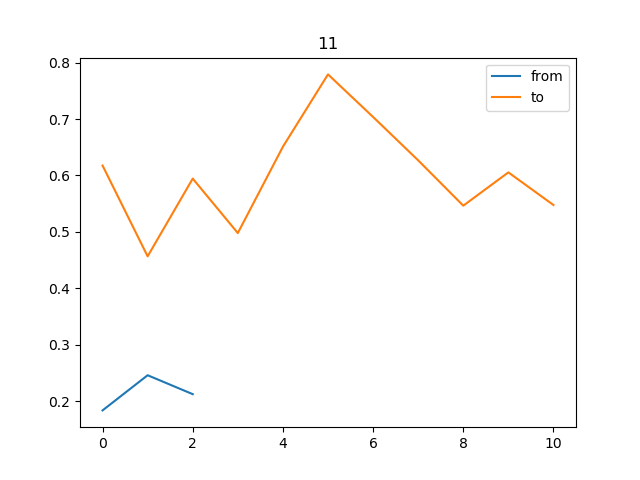

<IPython.core.display.Javascript object>


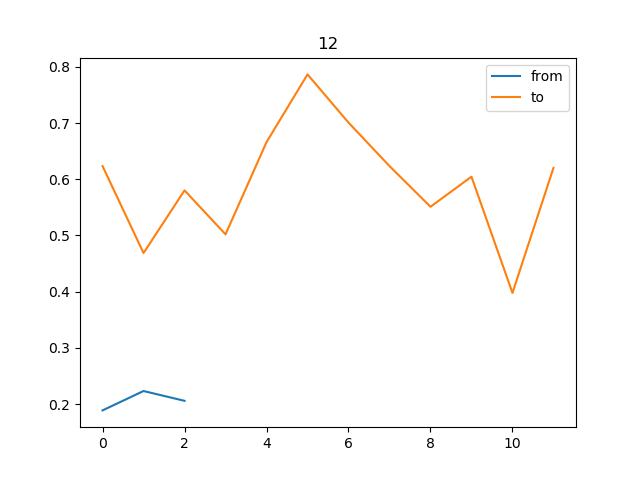

<IPython.core.display.Javascript object>


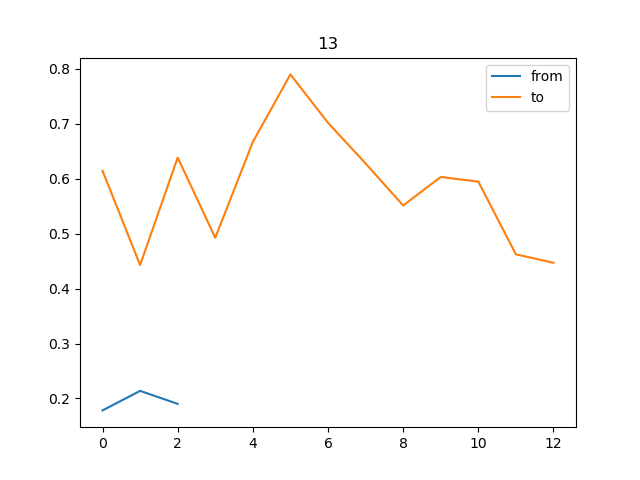

<IPython.core.display.Javascript object>


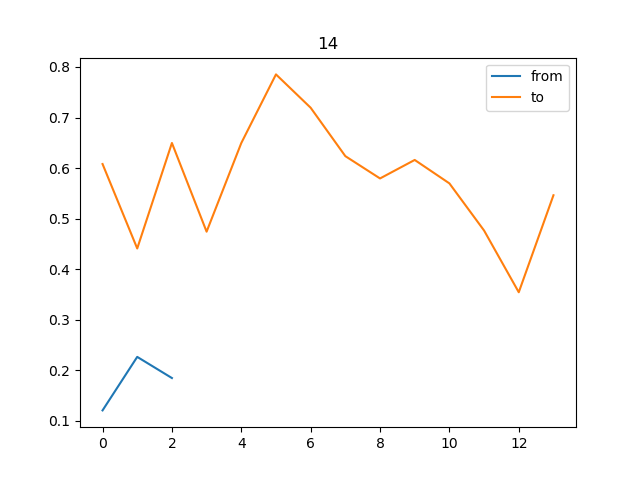

<IPython.core.display.Javascript object>


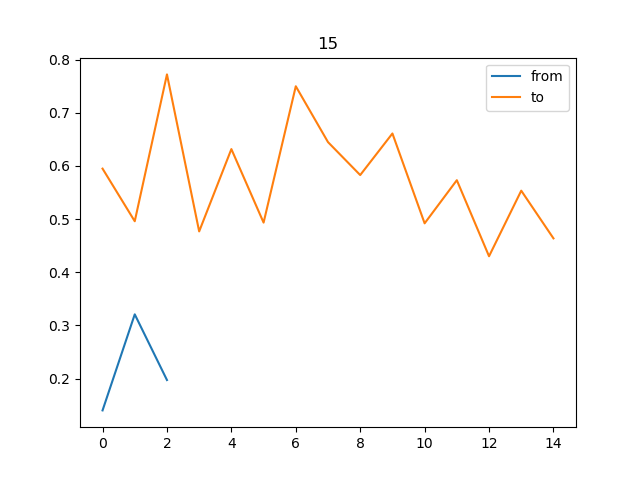

<IPython.core.display.Javascript object>


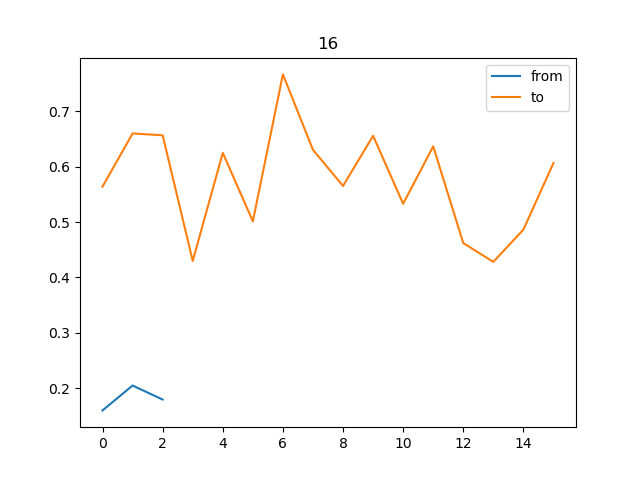

<IPython.core.display.Javascript object>


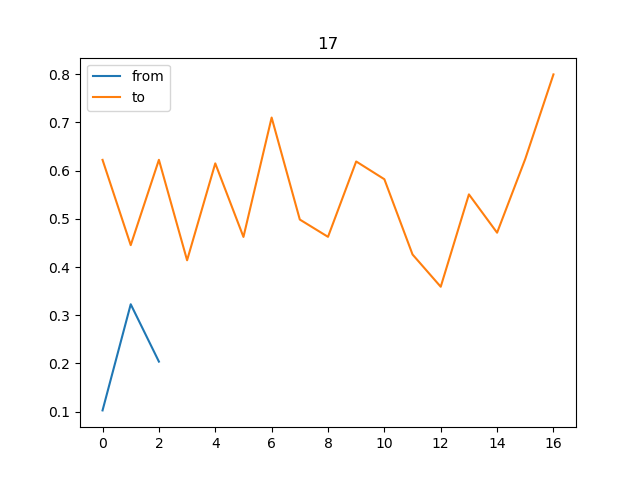

<IPython.core.display.Javascript object>


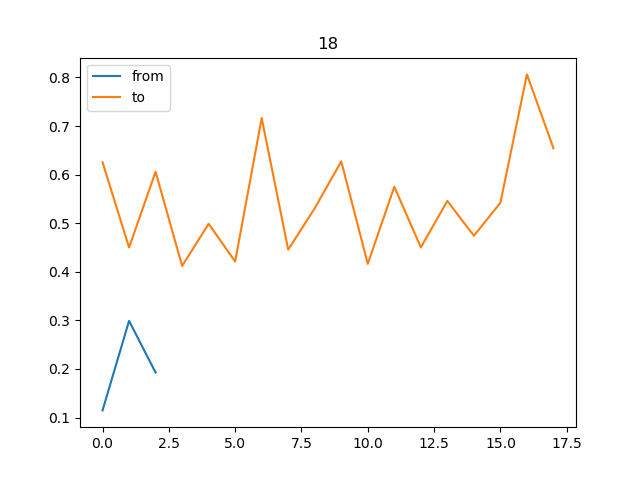

<IPython.core.display.Javascript object>


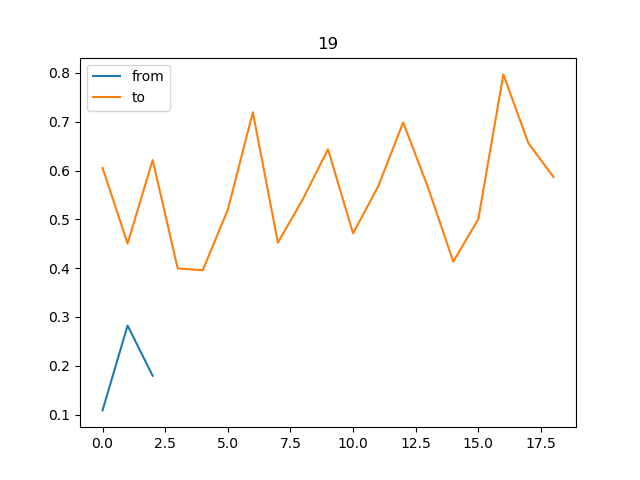

<IPython.core.display.Javascript object>


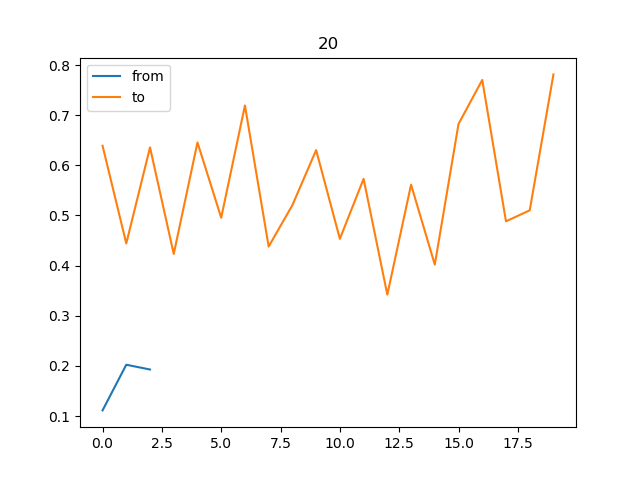

<IPython.core.display.Javascript object>


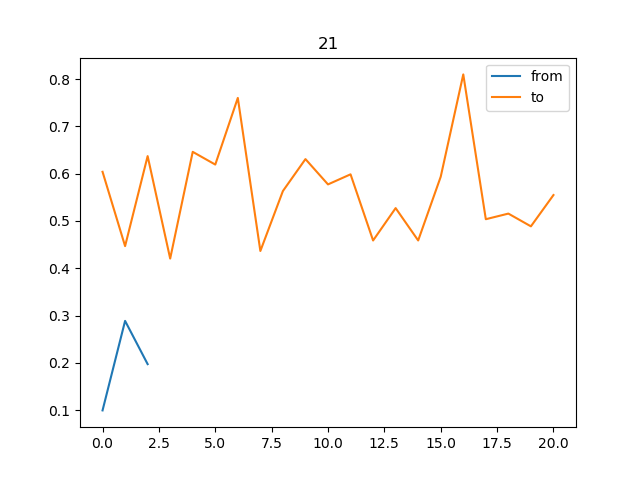

<IPython.core.display.Javascript object>


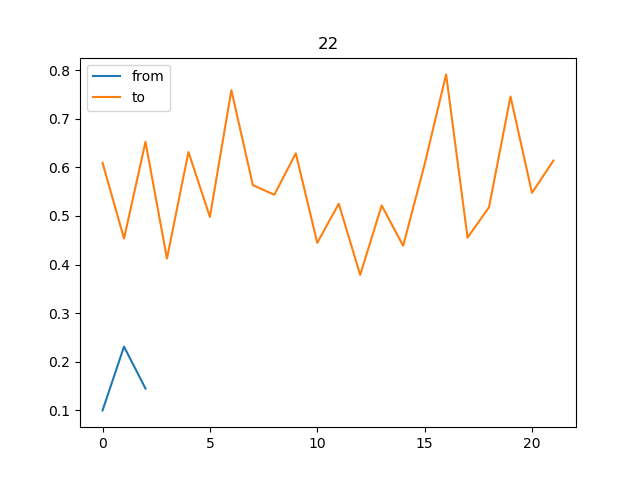

<IPython.core.display.Javascript object>


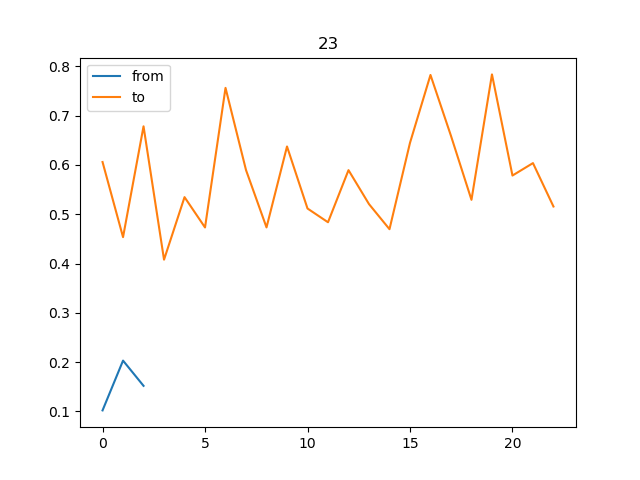

<IPython.core.display.Javascript object>


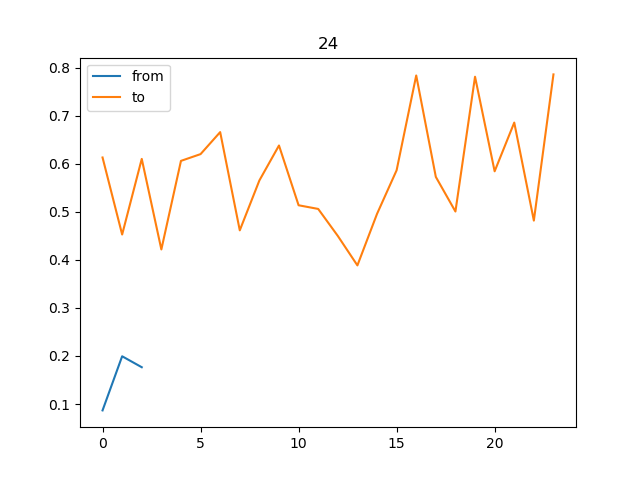

<IPython.core.display.Javascript object>


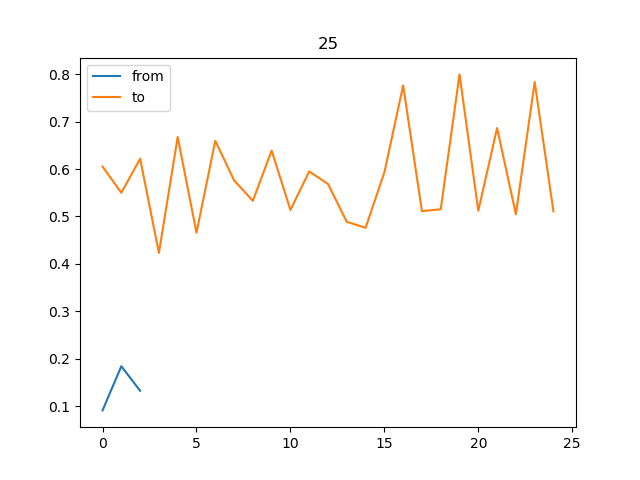

<IPython.core.display.Javascript object>


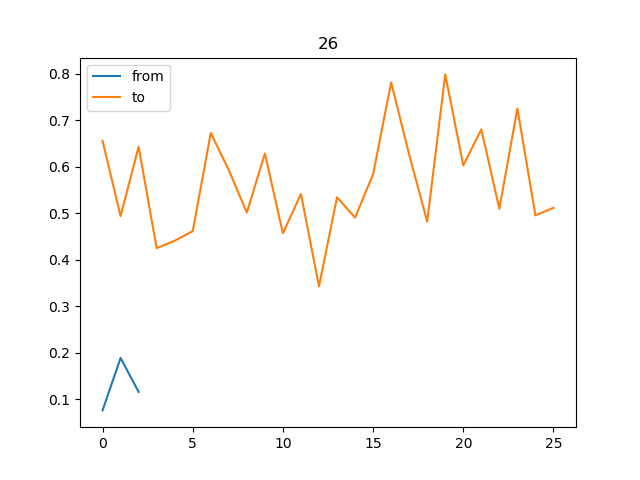

<IPython.core.display.Javascript object>


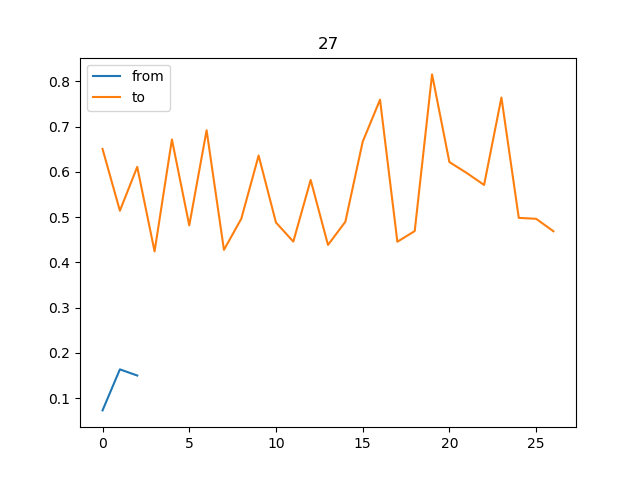

<IPython.core.display.Javascript object>


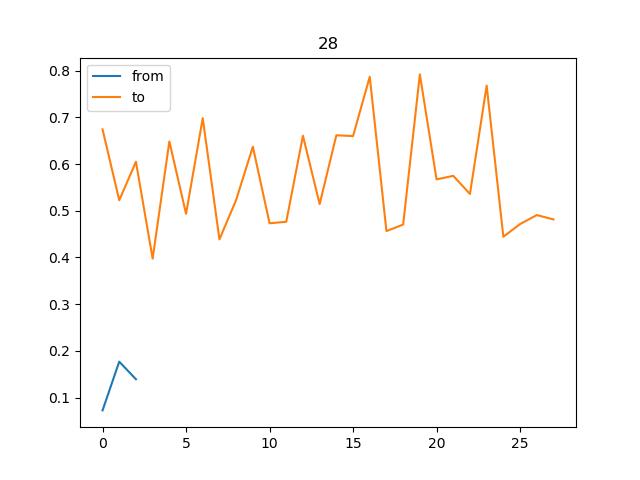

<IPython.core.display.Javascript object>


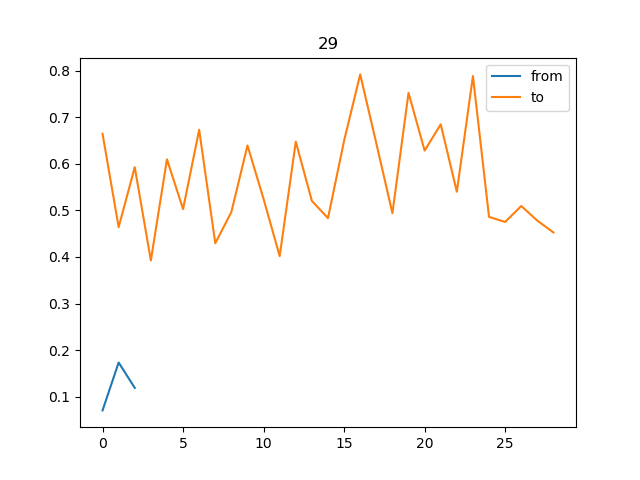

<IPython.core.display.Javascript object>


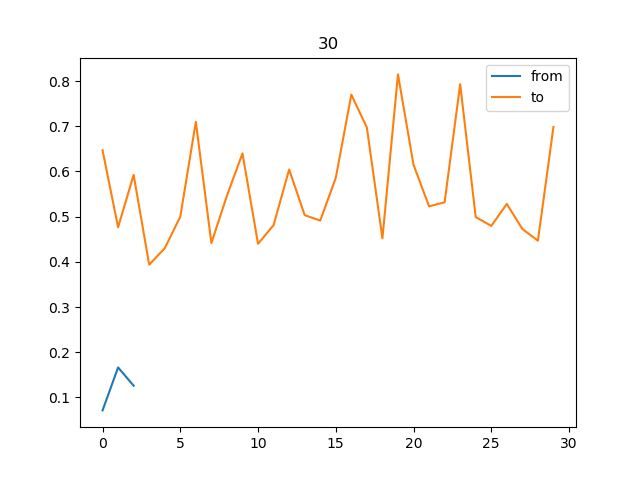

<IPython.core.display.Javascript object>


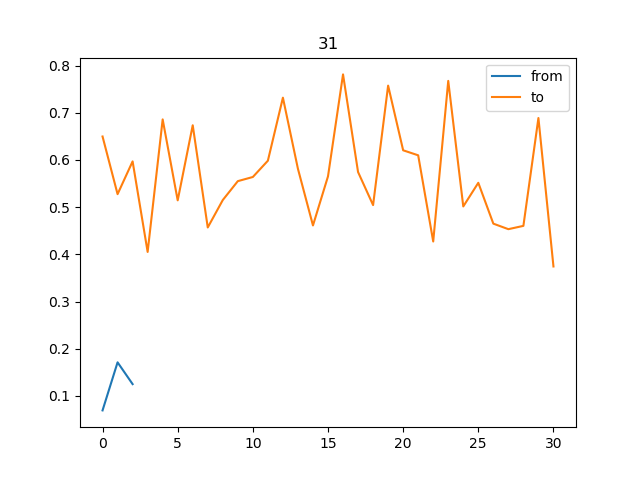

<IPython.core.display.Javascript object>


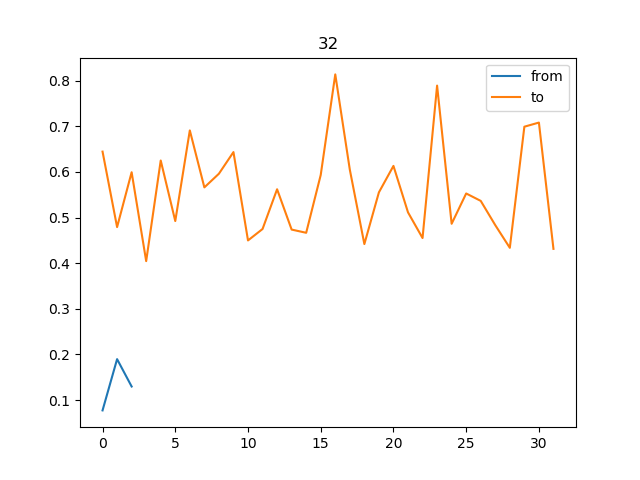

In [14]:
import matplotlib.pyplot as plt
for i in range(len(transition_matrix.keys())):
    fig = plt.figure()
    plt.plot(max_flows_from[i], label='from')
    plt.plot(max_flows_to[i], label='to')
    plt.title(valid_topic_numbers[i])
    plt.legend()

# Create Map

In [15]:
topic_names = {}
topic_names[2] = ['2 - Surface', '2 - Subsurface']
topic_names[3] = ['3 - 1', '3 - 2', '3 - 3']

topic_names[5] = ['5 - Climate Change',  '5 - Groundwater', '5 - Hydraulics', '5 - Terrestrial', '5 - Modeling']

topic_names[10] = ['10 - Climate Change', '10 - Groundwater', '10 - Hydraulic Modeling', '10 - Soil Moisture', 
                   '10 - Extreme Events', '10 - Flow & Transport', '10 - Forecasting', '10 - Catchment Modeling', 
                   '10 - Water Management', '10 - Streamflow & Sediment']

topic_names[15] = ['15 - Surface Fluxes', '15 - Groundwater', '15 - Flow & Transport Modeling', '15 - Soil Moisture', 
                   '15 - Statistical Hydrology', '15 - Rainfall-Runoff', '15 - Precipitation', '15 - Modeling', 
                   '15 - Climate Change', '15 - Snow Hydrology', '15 - Catchment Processes', '15 - Water Quality', 
                   '15 - Spatial Processes', '15 - Water Management', '15 - Sediment & Transport']

topic_names[20] = ['20 - Precipitation Variability', '20 - Groundwater', '20 - Modeling', '20 - Soil Moisture', 
                   '20 - Statistical Hydrology', '20 - Extreme Events', '20 - Precipitation', 
                   '20 - Scaling and Spatial Varaibility', '20 - Climate Change', '20 - Snow Hydrology', 
                   '20 - Streamflow & Surface Water', '20 - Water Chemistry', '20 - Dams and Reservoirs', 
                   '20 - Water Management', '20 - Sediment and Transport', '20 - Landcover', 
                   '20 - Subsurface Flow and Transport', 
                   '20 - Catchment Runoff', '20 - Land Surface', '20 - Vadose Zone']

topic_names[25] = ['25 - Precipitation Variability & Extremes', '25 - Hydrogeochemistry', '25 - Uncertainty', '25 - Soil Moisture',
                   '25 - Statistical Hydrology', '25 - Rainfall-Runoff', '25 - Precipitation Observation', '25 - Modeling & Calibration', 
                   '25 - Water Management', '25 - Snow Hydrology', '25 - Streamflow Processes', '25 - Water Quality', '25 - Channel Flow',
                   '25 - Floods', '25 - Sediment & Erosion', '25 - Climate Change', 'Subsurface Flow & Transport',
                   '25 - Scaling & Spatial Varaibility', '25 - Land Surface Fluxes', '25 - Hydrogeology', '25 - Human Intervention & Effects',
                   '25 - Land Cover', '25 - Systems Hydrology', '25 - Modeling & Forecasting', '25 - Groundwater']

In [16]:
# Define colors to associate with each topic
custom_colors = {
 'burlywood': '#DEB887',
 'chocolate': '#D2691E',
 'crimson': '#DC143C',
 'darkgreen': '#006400',
 'darkorange': '#FF8C00',
 'darkslategrey': '#2F4F4F',
 'deepskyblue': '#00BFFF',
 'dimgray': '#696969',
 'firebrick': '#B22222',
 'gold': '#FFD700',
 'goldenrod': '#DAA520',
 'lawngreen': '#7CFC00',
 'lightcoral': '#F08080',
 'lightpink': '#FFB6C1',
 'mediumvioletred': '#C71585',
 'orangered': '#FF4500',
 'orchid': '#DA70D6',
 'royalblue': '#4169E1',
 'slateblue': '#6A5ACD',
 'springgreen': '#00FF7F',
 'steelblue': '#4682B4',
 'teal': '#008080',
 'turquoise': '#40E0D0',
 'yellow': '#FFFF00',
 'blueviolet': '#8A2BE2',
 'yellowgreen': '#9ACD32'}

topic_colors = {}
topic_colors[2] = ['firebrick', 'royalblue']

topic_colors[3] = ['orchid', 'royalblue', 'firebrick']

topic_colors[5] = ['orangered', 'royalblue', 'slateblue', 'springgreen', 'firebrick']

topic_colors[10] = ['orangered', 'royalblue', 'slateblue', 'springgreen', 'orchid',
                   'steelblue', 'crimson', 'firebrick', 'darkgreen', 'gold']

topic_colors[15] = ['darkorange', 'royalblue', 'slateblue', 'springgreen', 'orchid',
                   'lightcoral', 'crimson', 'firebrick', 'orangered', 'yellow',
                   'burlywood', 'goldenrod', 'pink', 'darkgreen', 'gold']

topic_colors[20] = ['darkorange', 'royalblue', 'slateblue', 'springgreen', 'orchid',
                   'lightcoral', 'crimson', 'firebrick', 'orangered', 'yellow',
                   'burlywood', 'goldenrod', 'pink', 'darkgreen', 'gold',
                   'steelblue', 'crimson', 'firebrick', 'darkgreen', 'gold']

topic_colors[25] = ['dimgray', 'dimgray', 'dimgray', 'dimgray', 'dimgray',
                   'dimgray', 'dimgray', 'dimgray', 'dimgray', 'dimgray',
                   'dimgray', 'dimgray', 'dimgray', 'dimgray', 'dimgray',
                   'dimgray', 'dimgray', 'dimgray', 'dimgray', 'dimgray',
                   'dimgray', 'dimgray', 'dimgray', 'dimgray', 'dimgray']


In [17]:
use_indexes = [0,3,8,13,23]
# use_indexes = [0,13]

In [18]:
transition_matrix = {}
papers_per_topic = {}
for i, ui in enumerate(use_indexes):
    if i == len(use_indexes)-1:
        continue
    uj = use_indexes[i+1]
    transition_matrix[i] = np.full([valid_topic_numbers[ui], valid_topic_numbers[uj]], 0)
    for t1 in range(valid_topic_numbers[ui]):
        for t2 in range(valid_topic_numbers[uj]):
            transition_matrix[i][t1, t2] = np.sum( topic_distributions[valid_topic_numbers[ui]][:,t1] * 
                                                   topic_distributions[valid_topic_numbers[uj]][:,t2] )
#     for p in range(n_papers):
#         t1 = np.argmax(topic_distributions[valid_topic_numbers[i]][p,:])
#         t2 = np.argmax(topic_distributions[valid_topic_numbers[i+1]][p,:])
#         papers_per_topic[i][t1] = np.sum(topic_distributions[valid_topic_numbers[i]][:,t1])
#         if topic_distributions[valid_topic_numbers[i]][p,t1] > 0.5 and topic_distributions[valid_topic_numbers[i+1]][p,t2] > 0.5:
#             transition_matrix[i][t1, t2] = transition_matrix[i][t1, t2]+1

In [19]:
# Create link
link = {}
link['source'] = []
link['target'] = []
link['value'] = []
link['color'] = []

# Create nodes
node = {}
node['pad'] = 15
node['thickness'] = 20
node['line'] = dict(color = "black", width = 0.5)
node['label'] = []
node['color'] = []

for i, ui in enumerate(use_indexes):    
    for t in range(valid_topic_numbers[ui]):
        node['label'].append(topic_names[valid_topic_numbers[ui]][t])
        node['color'].append(topic_colors[valid_topic_numbers[ui]][t])

for i, ui in enumerate(use_indexes[:-1]):
    uj = use_indexes[i+1]
    tm = transition_matrix[i]
    for s in range(tm.shape[0]):
        for t in range(tm.shape[1]):
            if tm[s,t] < 0.10 * np.sum(tm[s,:]) or tm[s,t] < 0.10 * np.sum(tm[:,t]): 
                tm[s,t] = 0
#     tm[tm < 200] = 0
    for s in range(valid_topic_numbers[ui]):
        for t in range(valid_topic_numbers[uj]):
            source = [j for j, label in enumerate(node['label']) if label == topic_names[valid_topic_numbers[ui]][s]]
            target = [j for j, label in enumerate(node['label']) if label == topic_names[valid_topic_numbers[uj]][t]]
            link['source'].append(source[0])
            link['target'].append(target[0])
            link['value'].append(tm[s, t])
            link['color'].append(topic_colors[valid_topic_numbers[ui]][s])

In [20]:
from matplotlib import colors

opacity = 0.25

for l, color in enumerate(link['color']):
    link['color'][l] = f'rgba{colors.to_rgba(color, alpha=opacity)}'
    
# for l, color in enumerate(node['color']):
#     rgba = colors.to_rgba(color, alpha=opacity)
#     node['color'][l] = f'rgba{rgba}'    

In [21]:
plotdata = go.Sankey(node=node,link=link)
fig = go.Figure(data=[plotdata])
fig.update_layout(title_text="Test Sankey", font_size=10)
fig.update_layout(
    autosize=False,
    width=1750,
    height=750
)
fig.show()

In [22]:
import urllib, json

url = 'https://raw.githubusercontent.com/plotly/plotly.js/master/test/image/mocks/sankey_energy.json'
response = urllib.request.urlopen(url)
data = json.loads(response.read())

# override gray link colors with 'source' colors
opacity = 0.4
# change 'magenta' to its 'rgba' value to add opacity
data['data'][0]['node']['color'] = ['rgba(255,0,255, 0.8)' if color == "magenta" else color for color in data['data'][0]['node']['color']]
data['data'][0]['link']['color'] = [data['data'][0]['node']['color'][src].replace("0.8", str(opacity))
                                    for src in data['data'][0]['link']['source']]

fig = go.Figure(data=[go.Sankey(
    valueformat = ".0f",
    valuesuffix = "TWh",
    # Define nodes
    node = dict(
      pad = 15,
      thickness = 15,
      line = dict(color = "black", width = 0.5),
      label =  data['data'][0]['node']['label'],
      color =  data['data'][0]['node']['color']
    ),
    # Add links
    link = dict(
      source =  data['data'][0]['link']['source'],
      target =  data['data'][0]['link']['target'],
      value =  data['data'][0]['link']['value'],
      label =  data['data'][0]['link']['label'],
      color =  data['data'][0]['link']['color']
))])

fig.update_layout(title_text="Energy forecast for 2050<br>Source: Department of Energy & Climate Change, Tom Counsell via <a href='https://bost.ocks.org/mike/sankey/'>Mike Bostock</a>",
                  font_size=10)
fig.show()

In [23]:
data['data'][0]['link']['color']

['rgba(31, 119, 180, 0.4)',
 'rgba(255, 127, 14, 0.4)',
 'rgba(255, 127, 14, 0.4)',
 'rgba(255, 127, 14, 0.4)',
 'rgba(255, 127, 14, 0.4)',
 'rgba(227, 119, 194, 0.4)',
 'rgba(127, 127, 127, 0.4)',
 'rgba(188, 189, 34, 0.4)',
 'rgba(31, 119, 180, 0.4)',
 'rgba(23, 190, 207, 0.4)',
 'rgba(255, 127, 14, 0.4)',
 'rgba(255, 127, 14, 0.4)',
 'rgba(255, 127, 14, 0.4)',
 'rgba(140, 86, 75, 0.4)',
 'rgba(140, 86, 75, 0.4)',
 'rgba(140, 86, 75, 0.4)',
 'rgba(140, 86, 75, 0.4)',
 'rgba(140, 86, 75, 0.4)',
 'rgba(140, 86, 75, 0.4)',
 'rgba(140, 86, 75, 0.4)',
 'rgba(140, 86, 75, 0.4)',
 'rgba(140, 86, 75, 0.4)',
 'rgba(140, 86, 75, 0.4)',
 'rgba(140, 86, 75, 0.4)',
 'rgba(214, 39, 40, 0.4)',
 'rgba(140, 86, 75, 0.4)',
 'rgba(140, 86, 75, 0.4)',
 'rgba(140, 86, 75, 0.4)',
 'rgba(140, 86, 75, 0.4)',
 'rgba(140, 86, 75, 0.4)',
 'rgba(140, 86, 75, 0.4)',
 'rgba(127, 127, 127, 0.4)',
 'rgba(127, 127, 127, 0.4)',
 'rgba(127, 127, 127, 0.4)',
 'rgba(188, 189, 34, 0.4)',
 'rgba(23, 190, 207, 0.4)',
 'rgb